# Final Project
Friday May 17th, 2019 at 23:59

In [1]:
# Imports
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

import folium
from folium import plugins
from IPython.display import Image

#conda install -c conda-forge wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import json

### Motivation
According to [VisitDenmark](https://www.visitdenmark.dk/sites/default/files/VDK_Website_images/Corporate/Analyser/turismen_i_danmark.pdf) Denmark is the largest tourist nation in the Nordic countries with a tourism turnover of DKK 108.1 billion and with 12.5 million tourists overnight in Copenhagen every year. But Copenhagen is not known as a cheap city to live in and especially some areas can be quite expensive. With data about Airbnb's entry into Copenhagen, it is possible for us to provide an overview for the tourists about the possibilities of staying overnight in Copenhagen. For example, we will be able to investigate questions like:

- How does the city’s different neighborhoods differ when renting an Airbnb residence?
- Is there a pattern between prices, location and rating?
- Where are the most popular Airbnbs?
- Where can you find the Airbnb with the highest rating and best price ratio?
- Is there a correlation in price between real estate in Copenhagen and Airbnb residences from the same area?
- (Does tourist attraction have an influence on where tourists choose to stay?)


**What is your dataset?**<br>
    Our dataset is [Airbnb data](https://public.opendatasoft.com/explore/dataset/airbnb-listings/export/?disjunctive.host_verifications&disjunctive.amenities&disjunctive.features&location=6,52.60972,11.06323&basemap=jawg.streets) about rentable Airbnb's all over the world. The data has been filtered to only include data about Copenhagen and afterwards cleaned. Which resulted in 13 areas, xx Airbnb housings divided into xx types of housing, and xx hosts.

  The data specifications are as follows:
  - *Full dataset:*
      * 1.9GB
      * 494.954 rows
      * 90 variables
  - *Copenhagen subdataset:*
      * 67MB <br>
      * 20.548 rows <br>
      * 90 variables
  - *Cleaned Copenhagen data:*
      * 9509 rows
<br>

In addition, we also have a small dataset (79 KB) on [property prices in Copenhagen](https://rkr.statistikbank.dk/statbank5a/SelectVarVal/Define.asp?MainTable=BM011) for comparison.

**Why did you choose this/these particular dataset(s)?**<br>
    When researching datasets for our idea of making a narrative about Airbnb in Copenhagen, we stumbled upon a couple of datasets. The reason why this Airbnb dataset was chosen is the amount of information it contained including the necessary variables for an interesting data analysis and creating a fascinating narrative.<br>
    The property prices dataset from "Realkreditrådets statistik" was the only place where property prices over multiple years were available. After going through the prices and researching the source we found it reliable to use.
<br>

**What was your goal for the end user's experience?**<br>
    The goal was to give reader an insight into Airbnb in Copenhagen in terms of where to find the most suitable accomodations. As a tourist what do they consider important when visting Copenhagen and through that figuring out where to rent a place. This story might additionally help people living in Copenhagen to get an overview over and understanding into how to and what to do when listing their place at Airbnb.


### Basic stats
**Write about your choices in data cleaning and preprocessing**<br>
    Our dataset was about Airbnb world wide, so the first step was to filter the dataset to only contain data about Copenhagen. Next the dataset had to be cleaned to assure that no rows were missing necessary data. To do so we removed all rows with missing values required for our analysis using `dropna` on a subset consisting of the key columns. Before cleaning the Copenhagen dataset it contained 20548 rows and after it was about half as big with 9509 rows.

**Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.**<br>
With 90 columns and 20.500 rows the Airbnb dataset is pretty large which is always nice to work with. In the plots below we see that the amount of first and last reviews peak in the summer every year. This has probably something to do with people in general being more likely to travel in the summer time and therefore we also see that people review more in that time period. Simply because there is more **to review (ÆNDRES TIL ACTIVITY?)**. Furthermore we see that the renting price for an Airbnb accommodation per night is typically between 300-900 USD and 500 USD is the usual price. We also see from the data plots that Airbnb-guests nearly always rate the places/hosts they visit with the highest rating, 10, on all parameters. Unfortunately, this is properly not because all Airbnb rentals are actually perfect. This is a tendency we see in other rating-based services as well. For example, we also see [this inflation in top ratings with the taxi's counterpart to Airbnb, Uber](https://qz.com/1244155/good-luck-leaving-your-uber-driver-less-than-five-stars/). One could suspect that the guests and the hosts often make a gentleman's agreement on giving each other top ratings. If you take a look at the summaries for the rentals in each neighborhood, you will see from the generated wordclouds that, as expected from a selling text, all words are either positive or neutral. The most common words are words describing the area, such as "metro" for neighborhoods with a subway station, "canal" for neighborhoods close to the canals, "Christiania" for Christianshavn, "Kødbyen" for Vesterbro or "Opera" for Holmen. For the dataset regarding property prices in Copenhagen, we simply see that the price developments for the housing market has been rising in the past five years.

### Data Analysis
**Describe your data analysis and explain what you've learned about the dataset.**<br>


**Genre. Which genre of data story did you use?**<br>
The genre of choice for our project is the *Partitioned Poster*, which is a multi view visualization narrative without any order. We chose this way of communicating our narrative because the narrative doesn't need to take the reader by the arm for the reader to understand the project. Instead is gives the reader the possibility to explore the aspects they find most interesting to delve into, while still getting the full experience by interacting with the explanatory text telling the story.

**Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?**<br>
- *Visual structuring*: <br>
    * **Consistent Visual Platform**: When exploring our map of Copenhagen by selecting different options we've maintained the layout while only the content on the map changes. This way it's easier to detect any changes.
    <br>
- *Highlighting*: <br>
    * **Zooming**:  We chose to include the option to zoom in on a particular neighbourhood and get closer to the individual neighbourhood for the purpose of seeing the distribution of Airbnb's more accurately placed on the map. It's not only interesting to see the distribution in Copenhagen but also the distribution up close in individual parts of Copenhagen. <br>
    <br>
- *Transition Guidance*: <br>
    * **Animated Transitions**: To make the zooming more pleasant to watch an animated transition has been added. This makes it look like the district moves up hovering over Copenhagen.

**Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?**<br>
- *Ordering*: <br>
    * **Random Access**: We don't have a chronological order through our narrative, so the reader must choose their own and navigate through the project which is why the ordering of our project is Random Access.
    <br>
- *Interactivity*: <br>
    * **Filtering** / **Selection** / Search: Our map of Copenhagen has the options of selecting different filters to investigate different aspects of the Airbnb activities in the city. The reason for this is to give the reader an opportunity to delve into what they might find fascinating.
    * **Hover Highlighting / Details**: To view further details about each district in Copenhagen it's possible to hover over each district to expose an info box floating above the selected district. Without the details residing permanently on the map this tool keeps the visualization clean to look at, but still informative when hovering over each district.
    <br>
- *Messasing*:  <br>
    * **Captions / Headlines**: To give the poster some structure to guarantee that the reader understands the elements of the poster headlines and captions have been added.
    * **Introductory Text**: As mentioned eariler we don't have a chronological order through our narrative which is why the reader will be met by an introduction to the experience of Copenhagen Airbnb before going exploring through the poster.

### Visualizations
**Explain the visualizations you've chosen.**<br>
- Map of Copenhagen

- Amount of reviews

- Airbnb prices

- Ratings

- Ratings divided into categories

- Wordclouds

- Real estate price development i Copenhagen

**Why are they right for the story you want to tell?**<br>

**Discussion. Think critically about your creation**<br>

**What went well?**<br>

**What is still missing? What could be improved?, Why?**<br>


### Helping methods used throughout the assignment

In [2]:
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

In [3]:
# Returns a subset of the data depending on given dates at cateories (type of crime)
def getSubSet(dates, crimes, data):
    subset = []
    for date in dates:
        subset.append(data.loc[data['Date'].str.contains(date)])
    subset = pd.concat(subset)
    result = []
    for crime in crimes:
        result.append(subset.loc[subset['Category'].str.contains(crime)])
    return pd.concat(result)

In [4]:
def df_to_geojson(df, properties, lat='Latitude', lon='Longitude'):
    geojson = {'type':'FeatureCollection', 'features':[], 'totalFeatures':len(df), 'crs':{'type':'airbnb','properties':{'name':"urn:ogc:def:crs:EPSG::4326"}}}
    for _, row in df.iterrows():
        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]}}
        feature['geometry']['coordinates'] = [float(row[lon]),float(row[lat])]
        for prop in properties:
            feature[prop] = row[prop]
            feature[prop]['District'] = str.encode(str(row[prop]['District'])).decode('utf8')
        geojson['features'].append(feature)
    
    return geojson

## Import Data
To import the full dataset uncomment the code in the following cell.<br>
This is commented out since we only use the data dealing with Copenhagen.

In [5]:
# Import full dataset data
#data1 = pd.read_csv("../../airbnb-listings.csv", sep=';')
#print(len(data1))
#dkset = data.loc[data['Country'].str.contains("Denmark", na=False)]
#dkset.to_csv("airbnbDK", sep='\t')

In [6]:
# Import Copenhagen dataset data
data = pd.read_csv('airbnbDK', sep='\t') 

# Import sale times in Copenhagen
dataSalgstider = pd.read_excel('Salgstider.xlsx') 

# Import house prices in Copenhagen
dataEjendomspriser = pd.read_excel('Ejendomspriser.xlsx')


C:\Users\Jon Ravn Nielsen\AppData\Roaming\Python\Python37\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (0,1,20,47,50,60,63,64) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
# Data clean up - Remove Nan
dataNotNan = data.dropna(subset=['Price', 'First Review', 'Last Review', 'Latitude', 'Longitude', 'Neighbourhood', 'Host Since',
                                 'Review Scores Rating', 'Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location',  'Review Scores Value' ])
dataNotNan.reset_index()
print("Data before clean", len(data), "\nData after clean", len(dataNotNan))


Data before clean 20548 
Data after clean 9509


In [8]:
before = len(dataEjendomspriser)
for key in dataEjendomspriser.keys()[2:-2]:
    dataEjendomspriser = dataEjendomspriser[pd.to_numeric(dataEjendomspriser[key], errors='coerce').notnull()] 
    

print("Data before clean", before, "\nData after clean", len(dataEjendomspriser))

Data before clean 258 
Data after clean 168


In [9]:
# Data snippet
data.head(5)

,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",none,...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,101,6.45647e+06,https://www.airbnb.com/rooms/6456469,2.017062e+13,2017-06-15,Cozy rooms in hyggelig family apartment,Welcome to our home :) We normally rent out 2 ...,Welcome to our home :) Our home is the home of...,Welcome to our home :) We normally rent out 2 ...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6934389006, 12.4917170949","Host Has Profile Pic,Is Location Exact"
2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,none,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",none,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
4,104,1.6819e+07,https://www.airbnb.com/rooms/16819024,2.017062e+13,2017-06-15,"Bright and cozy, nordic design, Copenhagen",Charming modern apartment in a quiet location....,Kitchen: Feel free to use all of the equipment...,Charming modern apartment in a quiet location....,none,...,10.0,NaN,NaN,NaN,NaN,moderate,1.0,1.00,"55.6999702064, 12.5214007131","Host Has Profile Pic,Is Location Exact"


In [10]:
# Dataset attributes
temp = [print(i,"-",data.keys()[i]) for i in range(len(data.keys()))]

0 - Unnamed: 0
1 - ID
2 - Listing Url
3 - Scrape ID
4 - Last Scraped
5 - Name
6 - Summary
7 - Space
8 - Description
9 - Experiences Offered
10 - Neighborhood Overview
11 - Notes
12 - Transit
13 - Access
14 - Interaction
15 - House Rules
16 - Thumbnail Url
17 - Medium Url
18 - Picture Url
19 - XL Picture Url
20 - Host ID
21 - Host URL
22 - Host Name
23 - Host Since
24 - Host Location
25 - Host About
26 - Host Response Time
27 - Host Response Rate
28 - Host Acceptance Rate
29 - Host Thumbnail Url
30 - Host Picture Url
31 - Host Neighbourhood
32 - Host Listings Count
33 - Host Total Listings Count
34 - Host Verifications
35 - Street
36 - Neighbourhood
37 - Neighbourhood Cleansed
38 - Neighbourhood Group Cleansed
39 - City
40 - State
41 - Zipcode
42 - Market
43 - Smart Location
44 - Country Code
45 - Country
46 - Latitude
47 - Longitude
48 - Property Type
49 - Room Type
50 - Accommodates
51 - Bathrooms
52 - Bedrooms
53 - Beds
54 - Bed Type
55 - Amenities
56 - Square Feet
57 - Price
58 - We

## Mappings to Copeenhagen districts

In [11]:
# All Neighbourhoods
# set(data['Neighbourhood'].values)

# mapping:
cityAreas = {
    'Amager Vest': 'Amager Vest', 
    'Amagerbro':'Amager Øst',
    'Amager Øst':'Amager Øst',
    'Brønshøj':'Brønshøj-Husum ',
    'Christianshavn':'Christianshavn',
    'Frederiksberg':'Frederiksberg',
    'Holmen':'Indre By',
    'Indre By':'Indre By',
    'Islands Brygge':'Amager Vest',
    'København NV':'Bispebjerg',
    'Kødbyen':'Vesterbro',
    'Nyboder':'Østerbro',
    'Nørrebro':'Nørrebro',
    'Sluseholmen':'Kongens Enghave',
    'Teglholmen':'Kongens Enghave',
    'Valby':'Valby',
    'Vanløse':'Vanløse',
    'Vesterbro':'Vesterbro',
    'Østerbro':'Østerbro',
    'Kastrup':'Amager Vest'
}

In [12]:
# All zip codes
# set(dataPrice['Postnummer'].values)
# set(dataNotNan['Zipcode'].values)

# Mapping:
zipcodeToCityArea = {
    #range(1000, 1500) : 'Indre By', # og Christianshavn
    #range(1500, 1800) : 'Vesterbro',
    #range(1800, 2001) : 'Frederiksberg',
    #range(2100, 2200) : 'Østerbro',
    2200 : 'Nørrebro',
    2300 : 'Amager', # Amager øst og vest
    2400 : 'Bispebjerg',
    2450 : 'Kongens Enghave',
    2500 : 'Valby',
    2700 : 'Brønshøj-Husum ',
    2720 : 'Vanløse'
}

zipcodeToCityArea.update(
    dict(zip(range(1000,1500), ['Indre By' for i in range(1000,1500)])))
zipcodeToCityArea.update(
    dict(zip(range(1500,1800), ['Vesterbro' for i in range(1500,1800)])))
zipcodeToCityArea.update(
    dict(zip(range(1800,2001), ['Frederiksberg' for i in range(1800,2001)])))
zipcodeToCityArea.update(
    dict(zip(range(2100,2200), ['Østerbro' for i in range(2100,2200)])))
zipcodeToCityArea.update(
    dict(zip(range(2600,2700), ['Andet' for i in range(2600,2700)])))
zipcodeToCityArea.update(
    dict(zip(range(2730,2901), ['Andet' for i in range(2730,2901)])))




## Adding new Attributes to the dataset

In [13]:
# Round price to nearest 200
dataNotNan.loc[:,'Price to nearest 200'] = [p-p%200 if p%200 < 100 else p+(200-p%200) for p in dataNotNan['Price'].copy().values]
dataNotNan.groupby(['Price to nearest 200']).count()['ID']

C:\Users\Jon Ravn Nielsen\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\Jon Ravn Nielsen\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Price to nearest 200
0.0          3
200.0      732
400.0     2801
600.0     2797
800.0     2318
1000.0     858
Name: ID, dtype: int64

In [14]:
# Find District
dataNotNan.loc[:,'District'] = [cityAreas[n] for n in dataNotNan['Neighbourhood'].values]
set(dataNotNan['District'])

{'Amager Vest',
 'Amager Øst',
 'Bispebjerg',
 'Brønshøj-Husum ',
 'Christianshavn',
 'Frederiksberg',
 'Indre By',
 'Kongens Enghave',
 'Nørrebro',
 'Valby',
 'Vanløse',
 'Vesterbro',
 'Østerbro'}

In [15]:
dataNotNan.loc[:,'First Review Month'] = [fr[:7] for fr in dataNotNan['First Review'].values]
dataNotNan.loc[:,'Last Review Month'] = [lr[:7] for lr in dataNotNan['Last Review'].values]


In [16]:
dataNotNan.loc[:,'Host Since Month'] = [hs[:7] if not isfloat(hs) else hs for hs in dataNotNan['Host Since'].values ]


In [17]:
# Dataset attributes
temp = [print(i,"-",dataNotNan.keys()[i]) for i in range(len(dataNotNan.keys()))]

0 - Unnamed: 0
1 - ID
2 - Listing Url
3 - Scrape ID
4 - Last Scraped
5 - Name
6 - Summary
7 - Space
8 - Description
9 - Experiences Offered
10 - Neighborhood Overview
11 - Notes
12 - Transit
13 - Access
14 - Interaction
15 - House Rules
16 - Thumbnail Url
17 - Medium Url
18 - Picture Url
19 - XL Picture Url
20 - Host ID
21 - Host URL
22 - Host Name
23 - Host Since
24 - Host Location
25 - Host About
26 - Host Response Time
27 - Host Response Rate
28 - Host Acceptance Rate
29 - Host Thumbnail Url
30 - Host Picture Url
31 - Host Neighbourhood
32 - Host Listings Count
33 - Host Total Listings Count
34 - Host Verifications
35 - Street
36 - Neighbourhood
37 - Neighbourhood Cleansed
38 - Neighbourhood Group Cleansed
39 - City
40 - State
41 - Zipcode
42 - Market
43 - Smart Location
44 - Country Code
45 - Country
46 - Latitude
47 - Longitude
48 - Property Type
49 - Room Type
50 - Accommodates
51 - Bathrooms
52 - Bedrooms
53 - Beds
54 - Bed Type
55 - Amenities
56 - Square Feet
57 - Price
58 - We

# Map of the data

In [18]:
def addCrimeLocations(m, fgv, color, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = color, 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [19]:
def addCrimeLocationsColors(m, fgv, colors, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = colors[int(bnb[90]/200)], 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [20]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")

m = addCrimeLocations(m, fgv, 'Red', dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locations.html")
m
#Image("locations.png")

In [21]:
# Colors
#'red', 'blue', 'green', 'purple', 'orange', 'darkred', 
#'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 
#'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 
#'gray', 'black', 'lightgray'

In [22]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")
colors = ['yellow','green','cadetblue','orange','red','purple']

m = addCrimeLocationsColors(m, fgv, colors, dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locationsPriceColors.html")
m
# Image("locations.png")

# Extract Data for Observable

#### District Attributes (Average price / Count)

In [23]:
# Find price per district
districtAirbnb = dataNotNan.groupby(['District'])['Price'].sum().reset_index()

# Find number of Airbnb per district
countAirbnbDistrict = dataNotNan.groupby('District').count()['ID']

In [24]:
dataEjendomspriser.loc[:,'District'] = [zipcodeToCityArea[z] for z in dataEjendomspriser['Postnummer'].values]
districtEjendom = dataEjendomspriser.groupby(['District'])['2018K4'].sum().reset_index()

amager = districtEjendom.loc[districtEjendom['District']=='Amager']['2018K4'].values[0]
indreBy = districtEjendom.loc[districtEjendom['District']=='Indre By']['2018K4'].values[0]
districtEjendom = districtEjendom.append({'District':'Amager Vest', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Amager Øst', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Christianshavn', '2018K4':indreBy}, ignore_index=True)


In [25]:
countEjendomDistrict = dataEjendomspriser.groupby('District').count()
countEjendomDistrict = countEjendomDistrict['Navn'].reset_index()

amager = countEjendomDistrict.loc[countEjendomDistrict['District']=='Amager']['Navn'].values[0]
indreBy = countEjendomDistrict.loc[countEjendomDistrict['District']=='Indre By']['Navn'].values[0]

countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Vest', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Øst', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Christianshavn', 'Navn':indreBy}, ignore_index=True)


In [26]:
# combine data
districtAirbnb['District'] = [str.encode(str(d)).decode('utf8') for d in districtAirbnb['District'].values]
districtAirbnb['Count'] = [countAirbnbDistrict[d] for d in districtAirbnb['District'].values]
districtAirbnb['Average price'] = districtAirbnb['Price']/districtAirbnb['Count']
districtAirbnb['Average house price'] = [(districtEjendom.loc[districtEjendom['District']==d]['2018K4'].values[0]
                                        /countEjendomDistrict.loc[countEjendomDistrict['District']==d]['Navn'].values[0])
                                        for d in districtAirbnb['District'].values]
districtAirbnb


,District,Price,Count,Average price,Average house price
0,Amager Vest,445734.0,737,604.795115,39639.500000
1,Amager Øst,378613.0,669,565.938714,39639.500000
2,Bispebjerg,265545.0,553,480.189873,33671.666667
3,Brønshøj-Husum,75293.0,152,495.348684,31547.166667
4,Christianshavn,143040.0,208,687.692308,50634.000000
5,Frederiksberg,719984.0,1150,626.073043,45733.000000
6,Indre By,540470.0,767,704.654498,50634.000000
7,Kongens Enghave,35501.0,58,612.086207,40487.333333
8,Nørrebro,1259272.0,2159,583.266327,42867.333333
9,Valby,194147.0,376,516.348404,36170.666667


In [27]:
output_filename = 'airBnbDistrictData.json'
districtAirbnb.set_index('District').to_json(output_filename)

#### Airbnb places as geojson (individual locations)

In [28]:
# Find Airbnb places with properties
airbnbPlaces = dataNotNan.filter(['Latitude','Longitude'], axis=1)
#airbnbPlaces.to_csv("locationAndPrice.csv")
print(len(airbnbPlaces))

airbnbPlaces['properties'] = [row.to_dict() for idx, row in dataNotNan.filter(['Price','Property Type','District'], axis=1).iterrows()]
airbnbPlaces.head(5)


9509


,Latitude,Longitude,properties
0,55.695206,12.511293108812785,"{'Price': 649.0, 'Property Type': 'Apartment',..."
2,55.695235,12.507283859127154,"{'Price': 510.0, 'Property Type': 'Villa', 'Di..."
3,55.664765,12.614418747491374,"{'Price': 697.0, 'Property Type': 'Apartment',..."
6,55.656692,12.609505449062533,"{'Price': 644.0, 'Property Type': 'Apartment',..."
12,55.701262,12.474425857466034,"{'Price': 544.0, 'Property Type': 'House', 'Di..."


In [29]:
geojson = df_to_geojson(airbnbPlaces, ['properties']) 

output_filename = 'aitbnbPlaces.json'
with open(output_filename, 'w') as output_file:
    #output_file.write('var dataset = ')
    json.dump(geojson, output_file, indent=2, ensure_ascii=False)

In [30]:
# Load data again
# with open(output_filename) as json_file:  
#    data = json.load(json_file)
#data
set(dataNotNan['Property Type'].values)

{'Apartment',
 'Bed & Breakfast',
 'Boat',
 'Boutique hotel',
 'Cabin',
 'Camper/RV',
 'Condominium',
 'Dorm',
 'Guesthouse',
 'House',
 'Loft',
 'Other',
 'Tent',
 'Townhouse',
 'Treehouse',
 'Villa'}

# Statistics

### Basic stats. Let's understand the dataset better

Firstly, the full Airbnb-dataset of 1.9 GB is being cut down to only deal with Copenhagen and not all capitals in the world. 

Write about your choices in data cleaning and preprocessing
Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

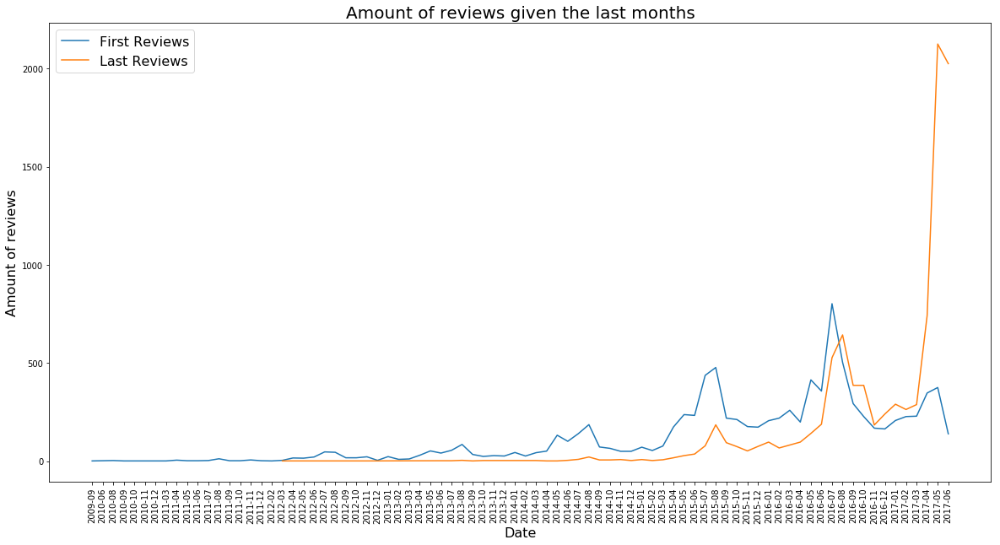

In [31]:
firstReviewData = dataNotNan.groupby('First Review Month').count()['ID']
lastReviewData = dataNotNan.groupby('Last Review Month').count()['ID']

plt.figure(figsize=(20,10))

plt.plot(firstReviewData.keys(), firstReviewData.values)

plt.plot(lastReviewData.keys(), lastReviewData.values)

plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['First Reviews','Last Reviews'], fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Amount of reviews', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.savefig("reviews.png")
plt.show()

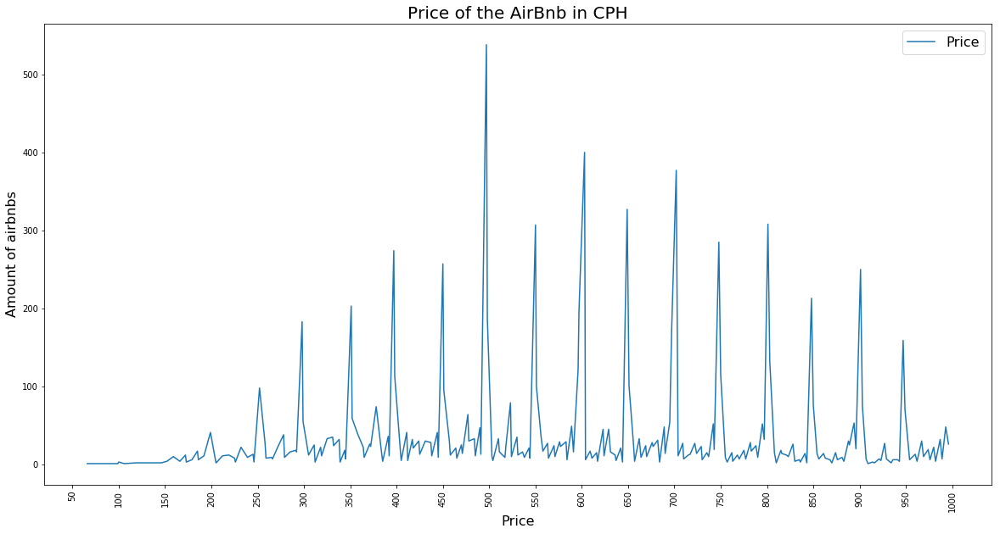

In [32]:
plt.figure(figsize=(20,10))
dataP = dataNotNan.groupby('Price')['ID'].count()

minP = min(dataP.keys())-min(dataP.keys())%50
maxP = max(dataP.keys())+50

plt.plot(dataP.keys(), dataP.values)

plt.xticks(np.arange(minP, maxP, 50.0), rotation='vertical')
plt.legend(['Price'], fontsize=16)
plt.xlabel('Price', fontsize=16)
plt.ylabel('Amount of airbnbs', fontsize=16)
plt.title('Price of the AirBnb in CPH', fontsize=20)
plt.savefig('pris.png')
plt.show()

In [33]:
rsr = dataNotNan.groupby('Review Scores Rating').count()['ID']
rsa = dataNotNan.groupby('Review Scores Accuracy').count()['ID']
rscl = dataNotNan.groupby('Review Scores Cleanliness').count()['ID']
rsch = dataNotNan.groupby('Review Scores Checkin').count()['ID']
rsco = dataNotNan.groupby('Review Scores Communication').count()['ID']
rsl = dataNotNan.groupby('Review Scores Location').count()['ID']
rsv = dataNotNan.groupby('Review Scores Value').count()['ID']

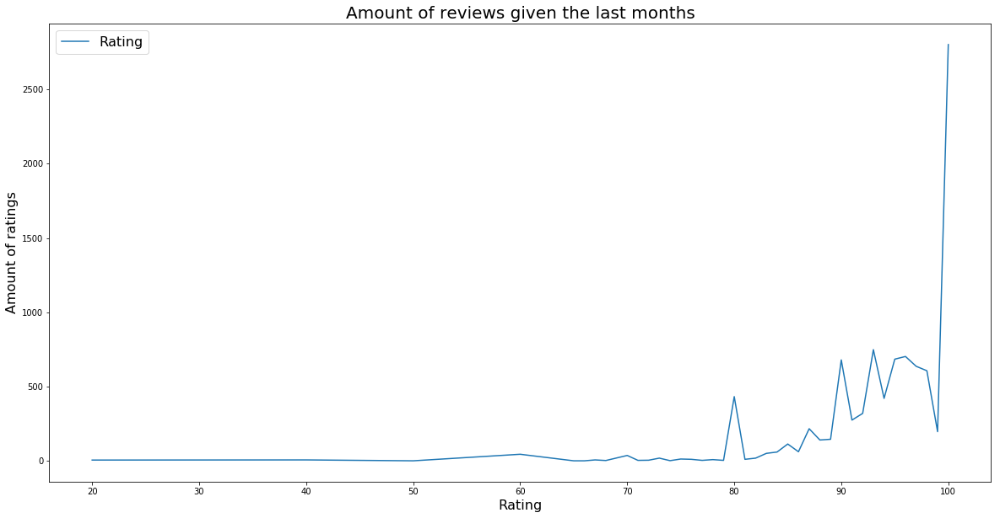

In [34]:
plt.figure(figsize=(20,10))
plt.plot(rsr.keys(), rsr.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Rating'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

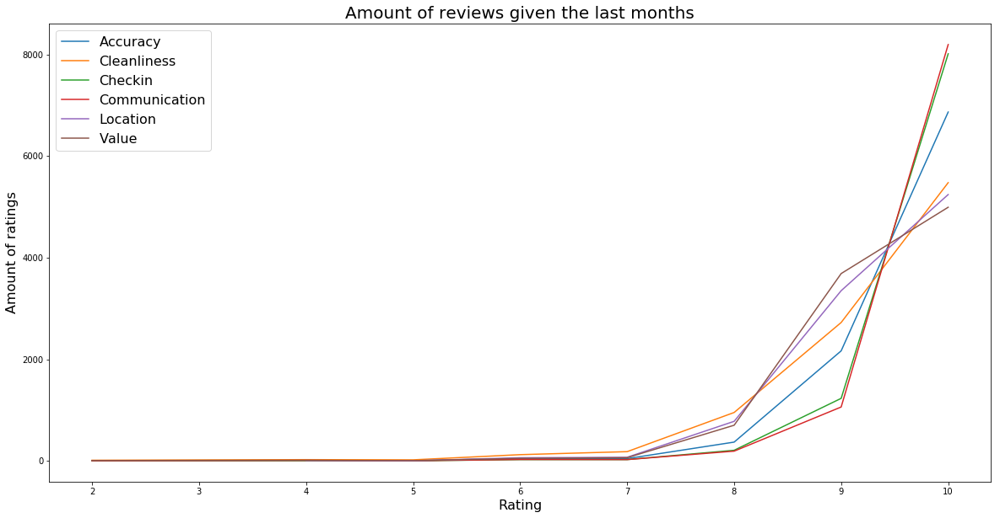

In [35]:
plt.figure(figsize=(20,10))

#plt.plot(rsr.keys(), rsr.values)
plt.plot(rsa.keys(), rsa.values)
plt.plot(rscl.keys(), rscl.values)
plt.plot(rsch.keys(), rsch.values)
plt.plot(rsco.keys(), rsco.values)
plt.plot(rsl.keys(), rsl.values)
plt.plot(rsv.keys(), rsv.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

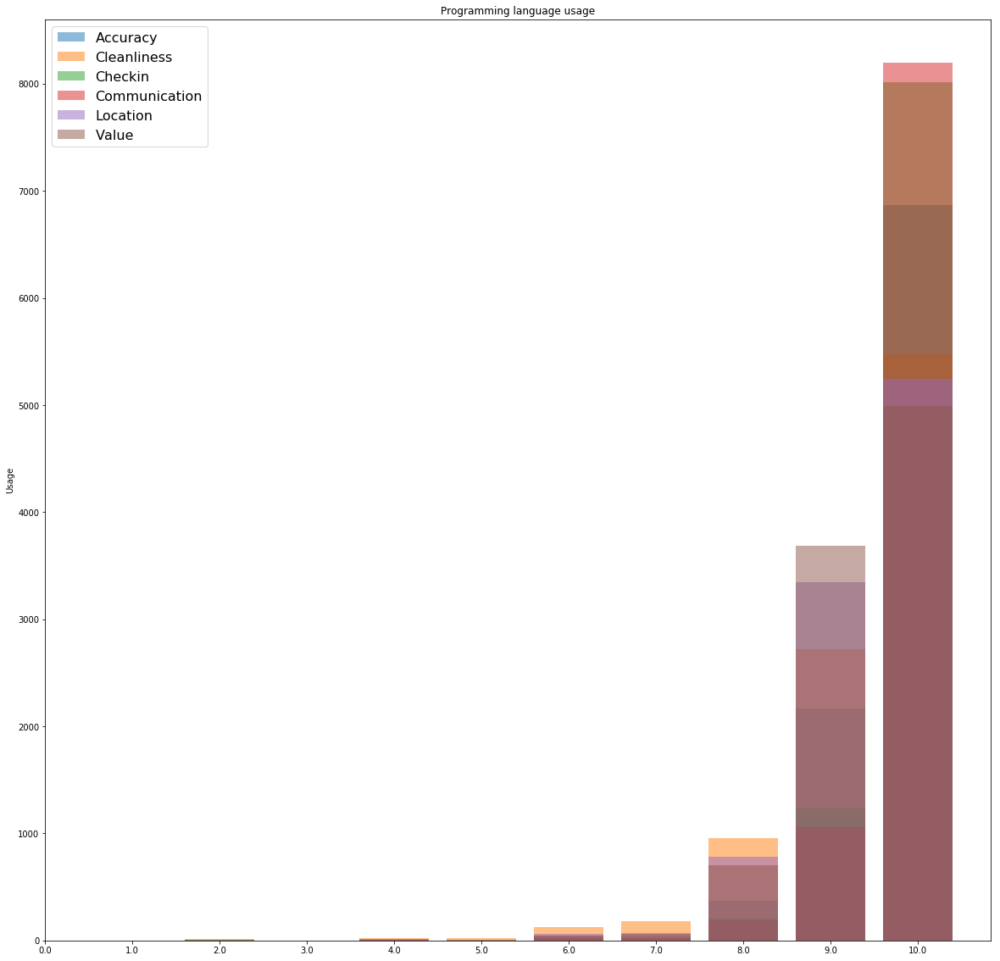

In [36]:
plt.figure(figsize=(20,20))
objects = np.arange(11.0)
y_pos = np.arange(11.0)
performance = rsr.values
    
plt.bar(rsa.keys(), rsa.values, align='center', alpha=0.5)
plt.bar(rscl.keys(), rscl.values, align='center', alpha=0.5)
plt.bar(rsch.keys(), rsch.values, align='center', alpha=0.5)
plt.bar(rsco.keys(), rsco.values, align='center', alpha=0.5)
plt.bar(rsl.keys(), rsl.values, align='center', alpha=0.5)
plt.bar(rsv.keys(), rsv.values, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.ylabel('Usage')
plt.title('Programming language usage')
 
plt.show()

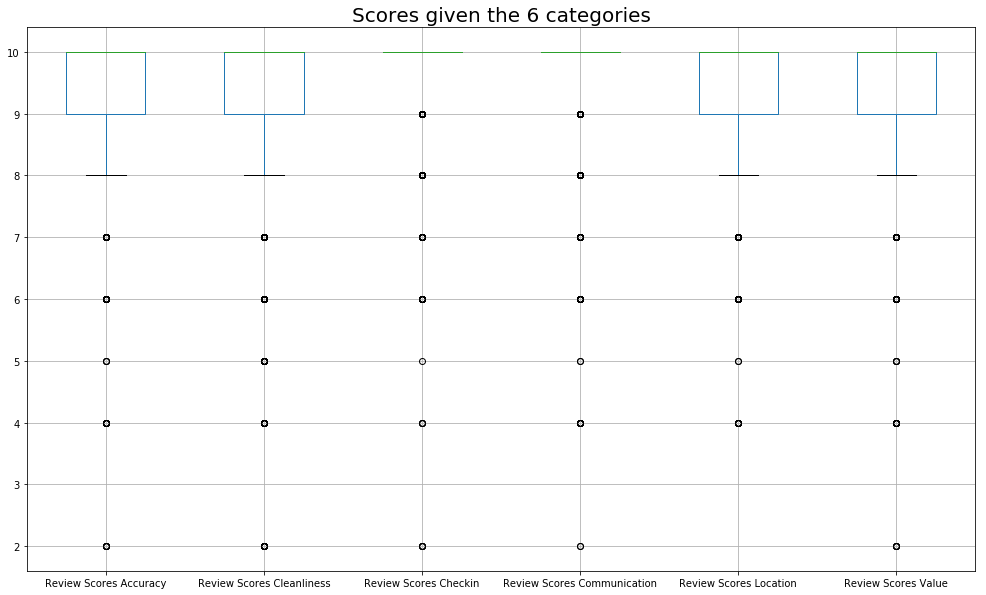

In [37]:
df = pd.DataFrame(data = dataNotNan, columns = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value'])

bp = df.boxplot(figsize=(17,10))
plt.title("Scores given the 6 categories", fontsize=20 )

plt.savefig("boxplot.png", format="png")
plt.show()

-  Review Scores Rating
-  Review Scores Accuracy
-  Review Scores Cleanliness
-  Review Scores Checkin
-  Review Scores Communication
-  Review Scores Location
-  Review Scores Value

In [38]:
ratings = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value']

lengthAnd = []
lengthOr = []

for score in range(1,11):
    testAnd = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           & (dataNotNan[ratings[1]] <= score)
           & (dataNotNan[ratings[2]] <= score)
           & (dataNotNan[ratings[3]] <= score)
           & (dataNotNan[ratings[4]] <= score)
           & (dataNotNan[ratings[5]] <= score)]

    testOr = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           | (dataNotNan[ratings[1]] <= score)
           | (dataNotNan[ratings[2]] <= score)
           | (dataNotNan[ratings[3]] <= score)
           | (dataNotNan[ratings[4]] <= score)
           | (dataNotNan[ratings[5]] <= score)]
    lengthOr.append(len(testOr))
    lengthAnd.append(len(testAnd))

(lengthOr, lengthAnd)

([0, 20, 20, 53, 80, 288, 569, 2238, 7020, 9509],
 [0, 0, 0, 2, 2, 4, 6, 46, 425, 9509])

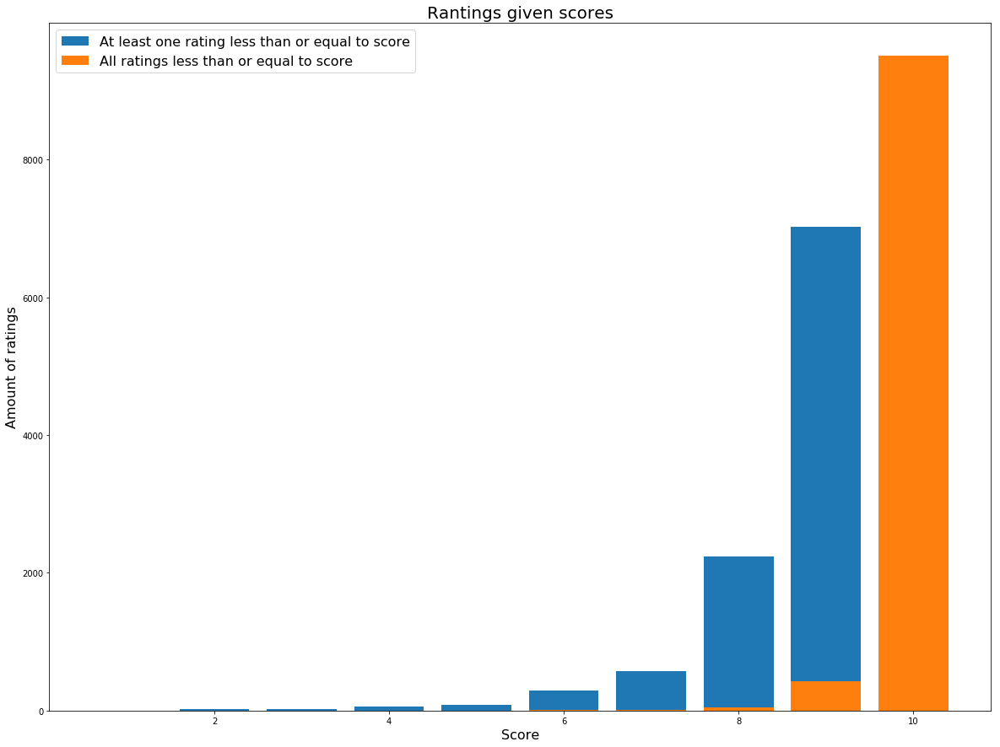

In [39]:
plt.figure(figsize=(20,15))

plt.bar(range(1,11),lengthOr)
plt.bar(range(1,11),lengthAnd)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['At least one rating less than or equal to score','All ratings less than or equal to score'], fontsize=16)
plt.xlabel('Score', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Ratings given scores', fontsize=20)
plt.show()

In [40]:
averageRatings = []
for r in ratings:
    averageRatings.append((r, sum(dataNotNan[r].values)/len(dataNotNan)))
    
averageRatings

[('Review Scores Accuracy', 9.648122831002208),
 ('Review Scores Cleanliness', 9.369229151330318),
 ('Review Scores Checkin', 9.8012409296456),
 ('Review Scores Communication', 9.820696182563887),
 ('Review Scores Location', 9.430329161846672),
 ('Review Scores Value', 9.411504890104112)]

In [41]:
a = dataNotNan.groupby(['Host Since Month','Number of Reviews'])
a.count()['ID']

Host Since Month  Number of Reviews
2009-03           7.0                   1
2009-04           3.0                   1
2009-05           12.0                  1
                  91.0                  1
2009-08           43.0                  1
2009-10           2.0                   1
                  27.0                  1
2009-12           10.0                  1
                  11.0                  1
                  38.0                  1
2010-01           12.0                  1
2010-02           4.0                   1
                  8.0                   1
                  40.0                  1
                  57.0                  1
2010-03           7.0                   1
                  12.0                  1
2010-04           1.0                   1
                  4.0                   1
                  10.0                  1
                  45.0                  1
                  143.0                 1
2010-05           1.0                   

In [42]:
a.count()['ID']

Host Since Month  Number of Reviews
2009-03           7.0                   1
2009-04           3.0                   1
2009-05           12.0                  1
                  91.0                  1
2009-08           43.0                  1
2009-10           2.0                   1
                  27.0                  1
2009-12           10.0                  1
                  11.0                  1
                  38.0                  1
2010-01           12.0                  1
2010-02           4.0                   1
                  8.0                   1
                  40.0                  1
                  57.0                  1
2010-03           7.0                   1
                  12.0                  1
2010-04           1.0                   1
                  4.0                   1
                  10.0                  1
                  45.0                  1
                  143.0                 1
2010-05           1.0                   

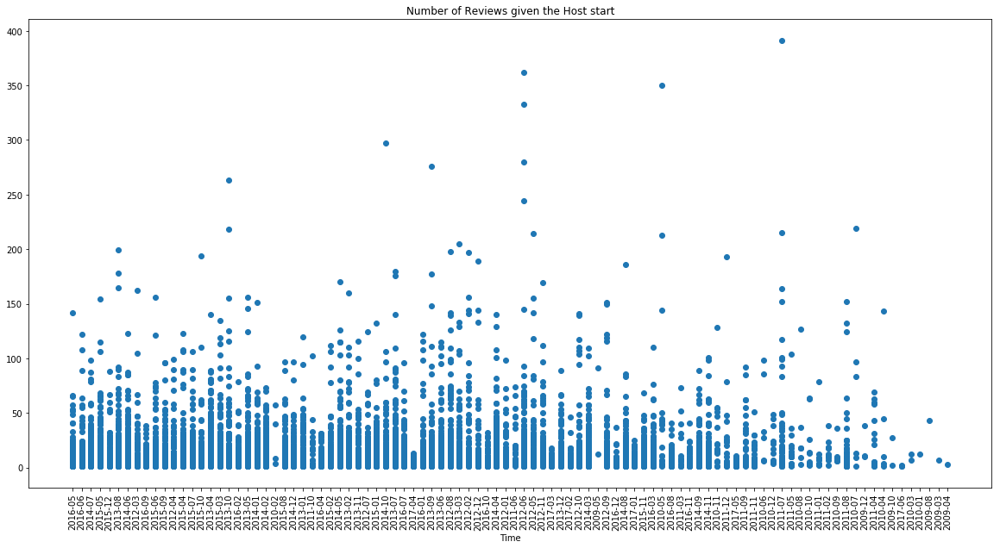

In [43]:

plt.figure(figsize=(20,10))
plt.plot(dataNotNan['Host Since Month'], dataNotNan['Number of Reviews'],'o')
plt.title("Number of Reviews given the Host start")
plt.xlabel('Time')
plt.xticks(rotation='vertical')
plt.show()

In [73]:
# all text
text = ' '.join([s for s in dataNotNan['Summary'].values if not isfloat(s)])


# text for all neighbourhood in a list
nHoodList = dataNotNan['Neighbourhood'].unique()

textList = []
for neighbourhood in nHoodList: 
    subset = dataNotNan.loc[dataNotNan['Neighbourhood'] == neighbourhood]
    text = ' '.join([s for s in subset['Summary'].values if not isfloat(s)])
    textList.append(text)


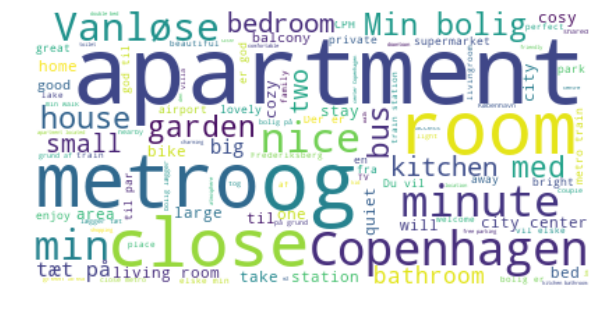

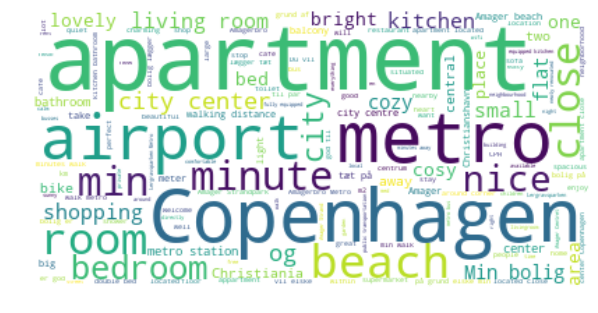

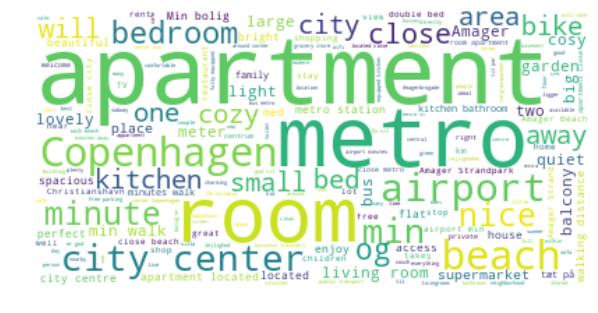

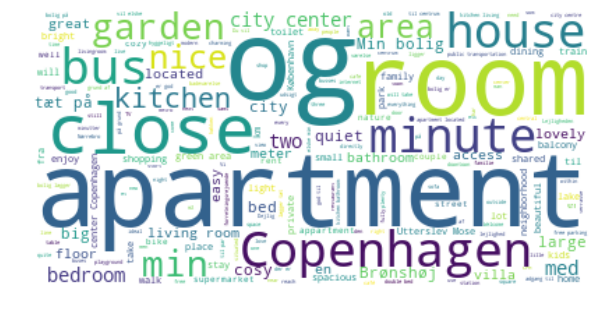

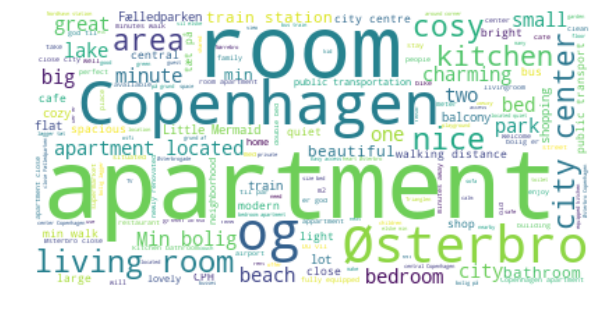

...

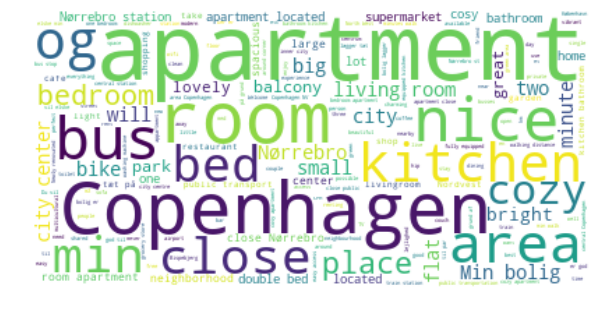

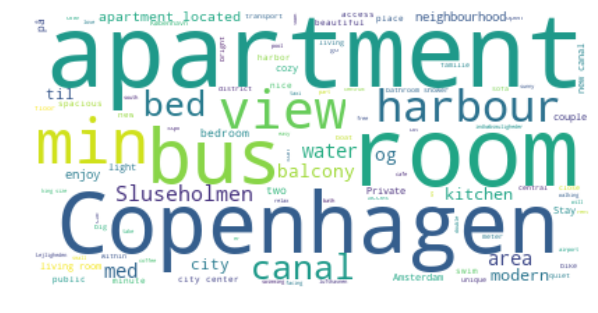

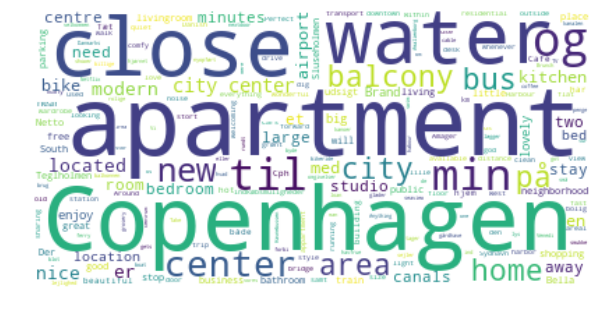

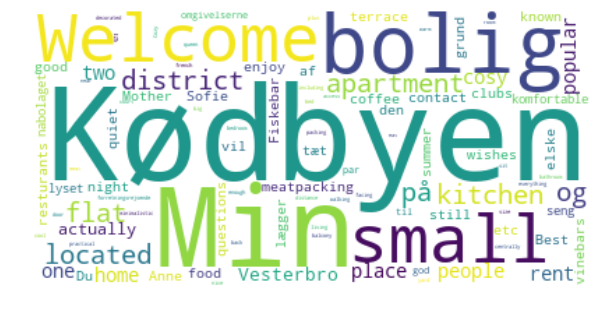

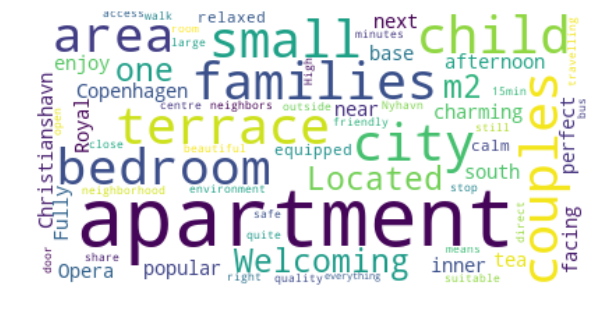

In [72]:
# generate wordclouds for all neighbourhoods
i = 0
for neighbourhood in textList:
    wordcloud = WordCloud(background_color="white").generate(neighbourhood)
    
    # Display the generated image:
    # the matplotlib way:
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('wordcloud_' + nHoodList[i] + '.png')
    i += 1
    plt.show()


# Property Prices Data

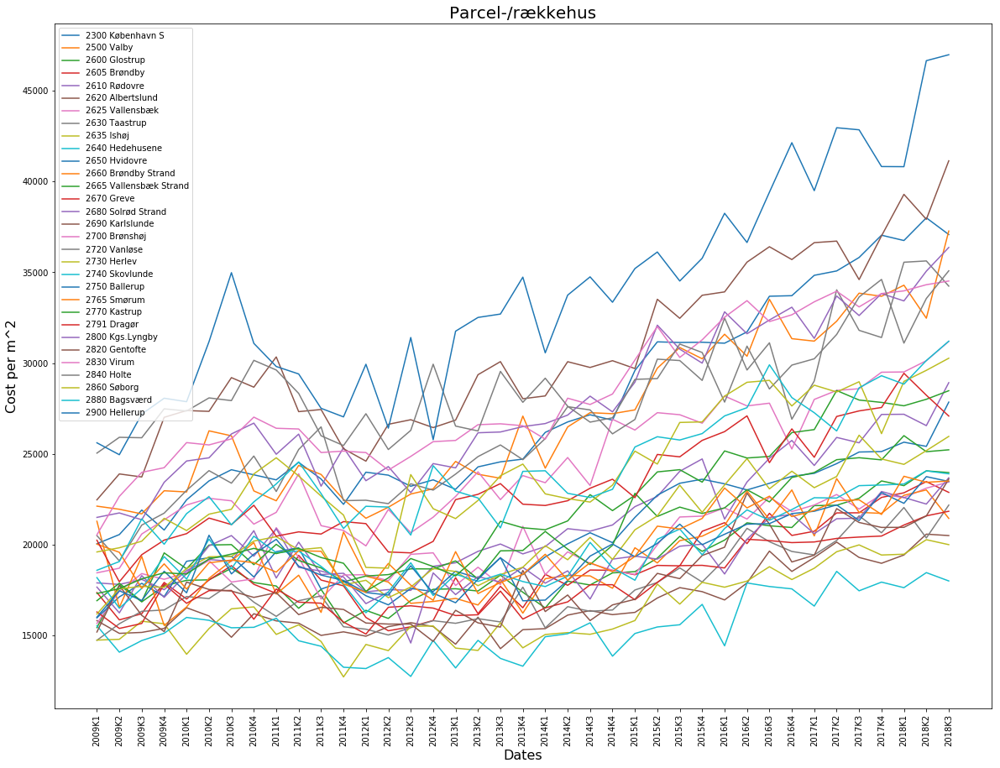

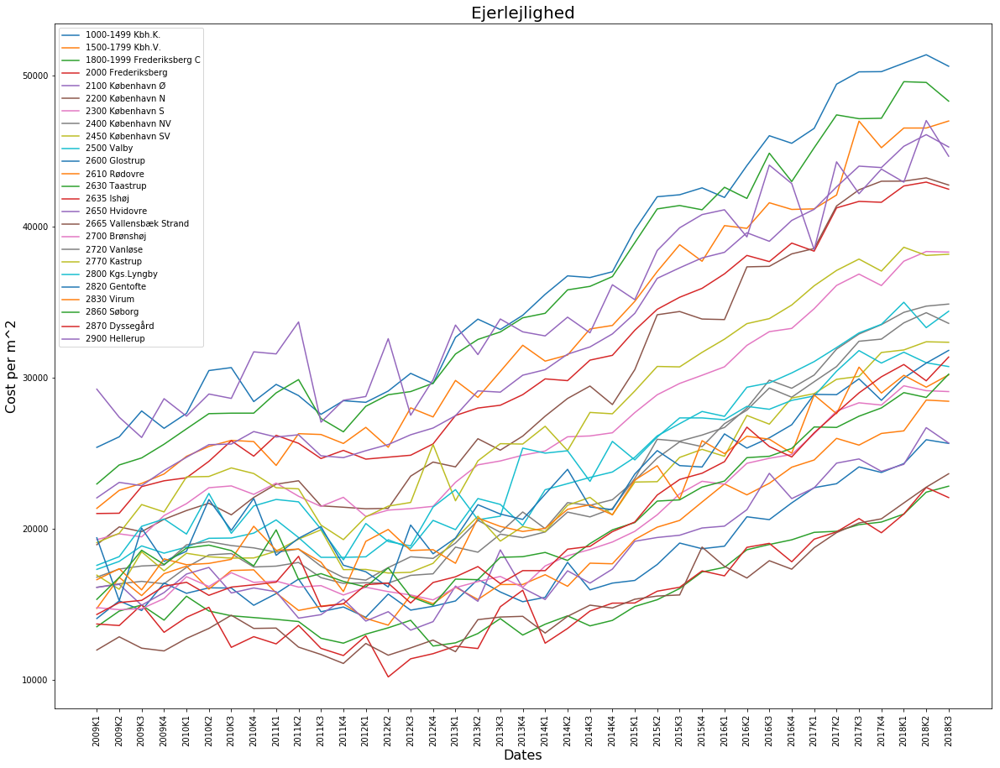

In [46]:
dataPrice = dataEjendomspriser.loc[dataEjendomspriser['Type Pris'].str.contains('Realiseret handelspris')]

for typeHouse in set(dataPrice['Type Hus']):
    subset = dataPrice.loc[dataPrice['Type Hus'].str.contains(typeHouse)]

    legends = []

    plt.figure(figsize=(20,15))
    for row in subset.values:
        temp = [r for r in row[2:41] if r != '..']
        if len(temp) == 39:
            plt.plot(temp)
            legends.append(row[1])

    plt.legend(legends)
    plt.title(typeHouse, fontsize=20)
    plt.xlabel('Dates', fontsize=16)
    plt.ylabel('Cost per m^2', fontsize=16)
    plt.xticks(range(39),subset.keys()[2:41], rotation='vertical')
    plt.show()